### SARnet: A CNN-based Approach for Despeckling of Synthetic Aperture Radar Imagery
### 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, ReLU, BatchNormalization, LeakyReLU, Lambda, Add, Reshape, Dense
from tensorflow.keras import backend as K
import os
from skimage.util import random_noise
from skimage.metrics import structural_similarity as ssim
import sys
import time
from tqdm.notebook import tqdm
import shutil

In [2]:
INPUT_SIZE= (64,64)
BS=16
ROOT_DIR="/kaggle/"

### Preparing DATA
- Using a part (Agriculture optical set S2) of the DataSet sentinel12-image-pairs-segregated-by-terrain


In [3]:
DATASET=os.path.join(ROOT_DIR,'input/sentinel12-image-pairs-segregated-by-terrain/v_2')
DATA_GEN_INPUT=os.path.join(ROOT_DIR,'DATASET')

if os.path.exists(DATA_GEN_INPUT):
    shutil.rmtree(DATA_GEN_INPUT)
os.mkdir(DATA_GEN_INPUT)

src=os.path.join(DATASET,"agri/s2")
dst=os.path.join(DATA_GEN_INPUT,"DATA")
os.symlink(src,dst)

In [4]:
def preprocessing_function(img):
    return np.float32(img/127.5-1)

In [5]:
generator=tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=preprocessing_function)
train_generator=generator.flow_from_directory(DATA_GEN_INPUT,
                                              target_size=INPUT_SIZE,
                                              class_mode=None,
                                              color_mode='grayscale',
                                              batch_size=BS,
                                              follow_links=True,)

Found 4000 images belonging to 1 classes.


- This is how the data looks like

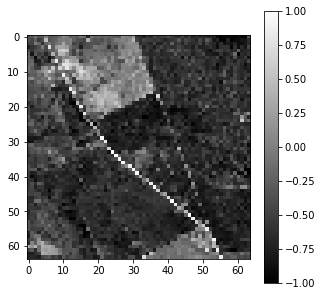

In [6]:
plt.figure(figsize=(5,5))
plt.imshow(next(train_generator)[0],cmap='gray')
plt.colorbar()

### Testing Model

In [7]:
def psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    psnr = 10 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

def uqi(img1, img2):
    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    num = (2 * np.sum(img1 * img2) + 0.01)
    den = (np.sum(img1 ** 2) + np.sum(img2 ** 2) + 0.01)
    return num / den

def enl(img):
    mean_val = np.mean(img)
    var_val = np.var(img)
    return mean_val ** 2 / var_val

def test_model(data_generator):
    img1,img2=next(data_generator)[:2]
    noise_var=np.random.rand()*.25
    # noise_var=.3
    noisy_img1=random_noise(img1,mode='speckle',var=noise_var,clip=True)
    noisy_img2=random_noise(img2,mode='speckle',var=noise_var,clip=True)
    noisy_img1=np.expand_dims(noisy_img1,axis=[0,-1])
    noisy_img2=np.expand_dims(noisy_img2,axis=[0,-1])
    denoised_img1=model.predict(noisy_img1)
    denoised_img2=model.predict(noisy_img2)
    fig,ax=plt.subplots(3,2,figsize=(10,12))
    mapple=ax[0,0].imshow(img1)
    plt.colorbar(mapple,ax=ax[0,0])
    mapple=ax[0,1].imshow(img2)
    plt.colorbar(mapple,ax=ax[0,1])
    mapple=ax[1,0].imshow(noisy_img1[0].reshape(INPUT_SIZE))
    plt.colorbar(mapple,ax=ax[1,0])
    mapple=ax[1,1].imshow(noisy_img2[0].reshape(INPUT_SIZE))
    plt.colorbar(mapple,ax=ax[1,1])
    mapple=ax[2,0].imshow(denoised_img1[0].reshape(INPUT_SIZE))
    plt.colorbar(mapple,ax=ax[2,0])
    mapple=ax[2,1].imshow(denoised_img2[0].reshape(INPUT_SIZE))
    plt.colorbar(mapple,ax=ax[2,1])
    plt.show()
    print("PSNR:", psnr(denoised_img1, denoised_img2))
    print("SSIM:", ssim(denoised_img1[0].reshape(INPUT_SIZE), denoised_img2[0].reshape(INPUT_SIZE), data_range=denoised_img2[0].reshape(INPUT_SIZE).max() - denoised_img2[0].reshape(INPUT_SIZE).min()))
    print("UQI:", uqi(denoised_img1[0].reshape(INPUT_SIZE), denoised_img2[0].reshape(INPUT_SIZE)))
    print("ENL:", enl(denoised_img1[0].reshape(INPUT_SIZE)))

### Model Creation

In [8]:
def self_attention(x):
    # First getting the shape of the input tensor
    batch_size, height, width, filters = K.int_shape(x)

    # Then flattening the dimensions
    reshaped_x = Reshape((height * width, filters))(x)

    # Then calculating the attention weights with softmax activation function
    attention_weights = Dense(height * width, activation='softmax')(reshaped_x)

    # Then applying the attention weights to the reshaped input
    attention_features = Dense(filters)(attention_weights)
    attention_features = Reshape((height, width, filters))(attention_features)

    # Finally combining the attention features with the original input
    x = Add()([attention_features, x])
    return x

def SARnet(input_shape=(256,256,1)):
    input_layer = Input(shape=input_shape)
    x = Conv2D(filters=64, kernel_size=(3,3), padding='same')(input_layer)
    x = ReLU()(x)

    # Defining a function for a convolutional block
    def conv_block(x, filters, kernel_size, padding='same', use_batch_norm=False):
        x = Conv2D(filters=filters, kernel_size=kernel_size, padding=padding)(x)
        if use_batch_norm:
            x = BatchNormalization()(x)
            x = ReLU()(x)
        return x

    # Adding convolutional blocks with skip connections
    for i in range(1, 23):
        skip_connection = x
        x = conv_block(x, filters=64, kernel_size=(3,3), use_batch_norm=i % 2 == 0)
        if i % 2 == 0:
            x = Add()([skip_connection, x])  # Adding skip connection every 2nd layers

        # Appling self-attention based on the every 5th layers
        if i % 5 == 0:
            x = self_attention(x)

    # Final convolutional layer
    x = conv_block(x, filters=1, kernel_size=(3,3))
    x = Lambda(lambda x: x + tf.constant(1e-7))(x)
    x = tf.math.divide(input_layer, x)
    x = tf.math.tanh(x)

    return tf.keras.Model(inputs=input_layer, outputs=x)

### Loss Function 
-  Using MeanSquaredError and total_variation to implement the loss function 

In [9]:
MSE=tf.keras.losses.MeanSquaredError(reduction='none')
def loss_fn(y_true,y_pred,l_tv=.0002):
    mse=tf.reduce_sum(MSE(y_true,y_pred))
    variational_loss=tf.image.total_variation(y_pred)
    weight_loss = tf.reduce_sum(tf.math.abs(tf.math.divide(1,y_pred+1e-5)))
    total_loss=mse+l_tv*variational_loss
    return tf.reduce_mean(total_loss),tf.reduce_mean(mse),tf.reduce_mean(variational_loss)

### Training 

In [10]:
@tf.function
def step(noisy_data, clean_data):
    with tf.GradientTape() as tape:
        pred = model(noisy_data,training=True) 
        total_loss,loss_euclidian,loss_tv = loss_fn(clean_data, pred)
        loss=tf.add_n([total_loss],model.losses)
    grads = tape.gradient(total_loss, model.trainable_weights)
    opt.apply_gradients(zip(grads, model.trainable_weights))
    return loss,loss_euclidian,loss_tv

In [11]:
model=SARnet(list(INPUT_SIZE)+[1])

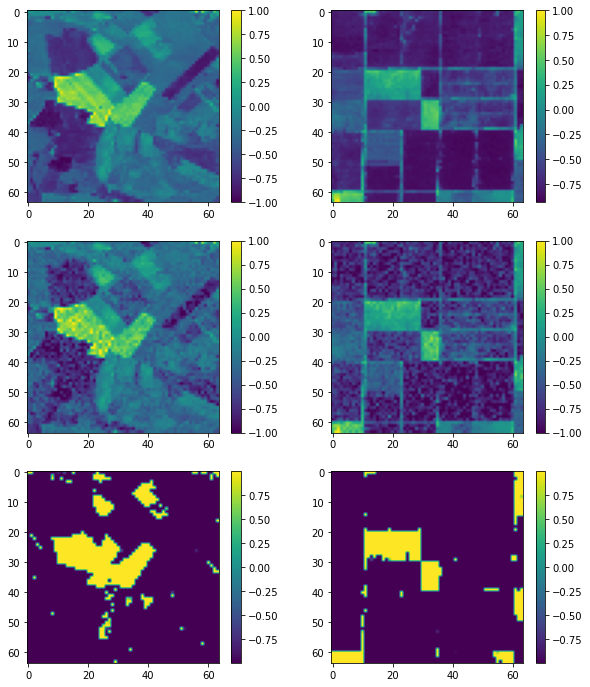

In [12]:
test_model(train_generator)

[INFO] starting epoch 1/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1865.556884765625 loss_euclidian:  1865.2576904296875 loss_tv:  1496.660400390625


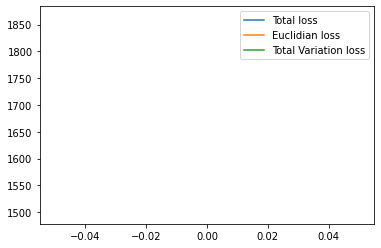

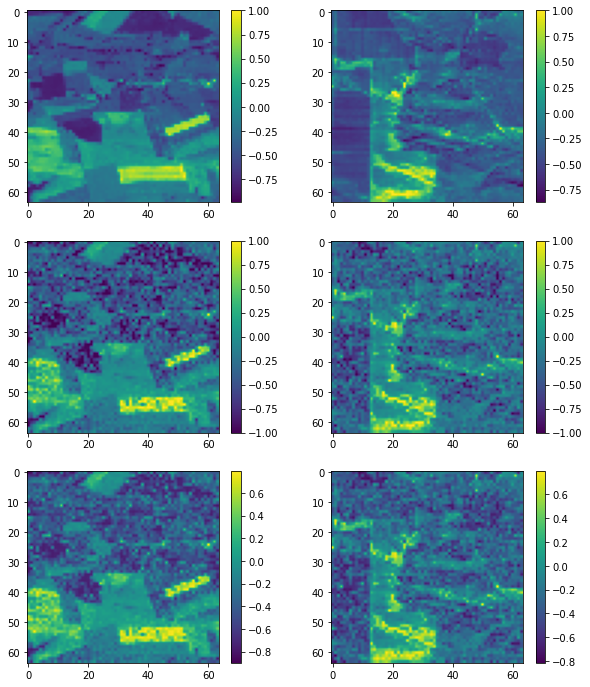

took 0.5621 minutes
[INFO] starting epoch 2/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1384.7789306640625 loss_euclidian:  1384.50439453125 loss_tv:  1370.311767578125
took 0.3032 minutes
[INFO] starting epoch 3/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1252.5875244140625 loss_euclidian:  1252.324462890625 loss_tv:  1312.128173828125
took 0.2951 minutes
[INFO] starting epoch 4/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1111.8673095703125 loss_euclidian:  1111.618408203125 loss_tv:  1244.1663818359375
took 0.3016 minutes
[INFO] starting epoch 5/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1217.6168212890625 loss_euclidian:  1217.3695068359375 loss_tv:  1236.2086181640625
took 0.293 minutes
[INFO] starting epoch 6/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1087.462890625 loss_euclidian:  1087.2225341796875 loss_tv:  1199.666259765625


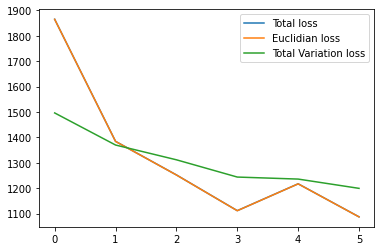

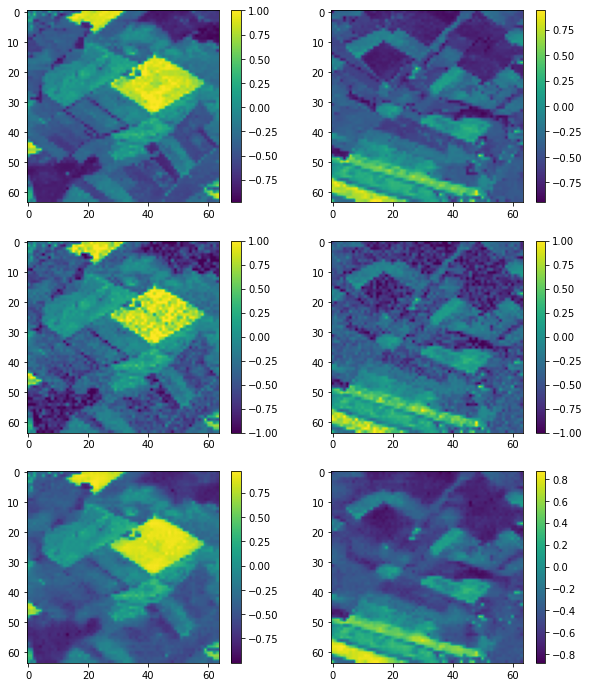

took 0.3278 minutes
[INFO] starting epoch 7/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1314.2081298828125 loss_euclidian:  1313.9295654296875 loss_tv:  1392.97119140625
took 0.2969 minutes
[INFO] starting epoch 8/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1526.3392333984375 loss_euclidian:  1526.0150146484375 loss_tv:  1617.71728515625
took 0.2986 minutes
[INFO] starting epoch 9/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1435.4652099609375 loss_euclidian:  1435.1455078125 loss_tv:  1599.3243408203125
took 0.3026 minutes
[INFO] starting epoch 10/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1342.2269287109375 loss_euclidian:  1341.933349609375 loss_tv:  1467.4033203125
took 0.3005 minutes
[INFO] starting epoch 11/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1143.2025146484375 loss_euclidian:  1142.955078125 loss_tv:  1237.408447265625


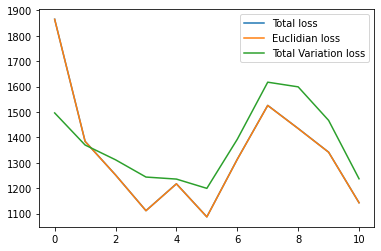

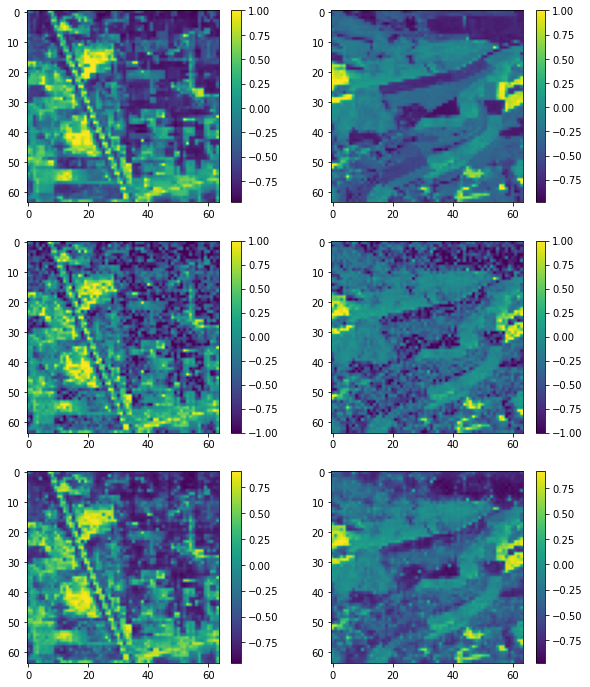

took 0.3202 minutes
[INFO] starting epoch 12/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1055.2152099609375 loss_euclidian:  1054.9786376953125 loss_tv:  1182.865234375
took 0.2953 minutes
[INFO] starting epoch 13/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1234.6466064453125 loss_euclidian:  1234.388671875 loss_tv:  1291.7777099609375
took 0.302 minutes
[INFO] starting epoch 14/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1267.8067626953125 loss_euclidian:  1267.5413818359375 loss_tv:  1325.2664794921875
took 0.2925 minutes
[INFO] starting epoch 15/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1200.5369873046875 loss_euclidian:  1200.2877197265625 loss_tv:  1250.5142822265625
took 0.3042 minutes
[INFO] starting epoch 16/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1153.6153564453125 loss_euclidian:  1153.3592529296875 loss_tv:  1280.5015869140625


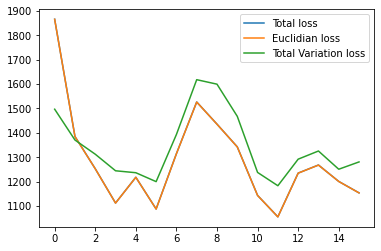

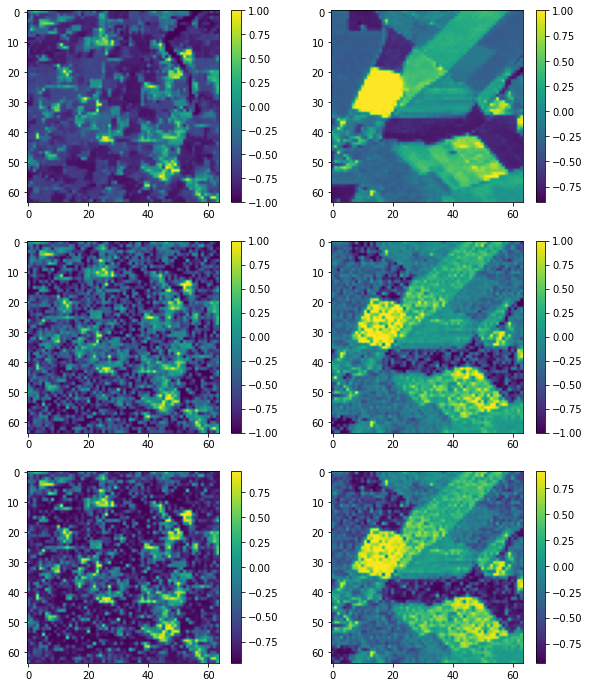

took 0.327 minutes
[INFO] starting epoch 17/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1098.8428955078125 loss_euclidian:  1098.596435546875 loss_tv:  1231.6497802734375
took 0.2927 minutes
[INFO] starting epoch 18/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1123.01171875 loss_euclidian:  1122.7652587890625 loss_tv:  1234.4927978515625
took 0.3059 minutes
[INFO] starting epoch 19/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1057.7528076171875 loss_euclidian:  1057.5191650390625 loss_tv:  1165.208984375
took 0.2964 minutes
[INFO] starting epoch 20/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  985.2357788085938 loss_euclidian:  985.0104370117188 loss_tv:  1126.797119140625
took 0.3015 minutes
[INFO] starting epoch 21/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1096.8851318359375 loss_euclidian:  1096.6461181640625 loss_tv:  1194.5631103515625


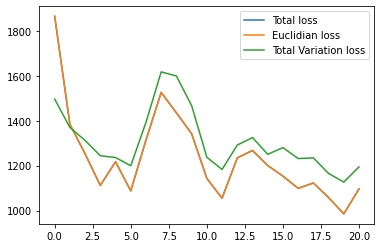

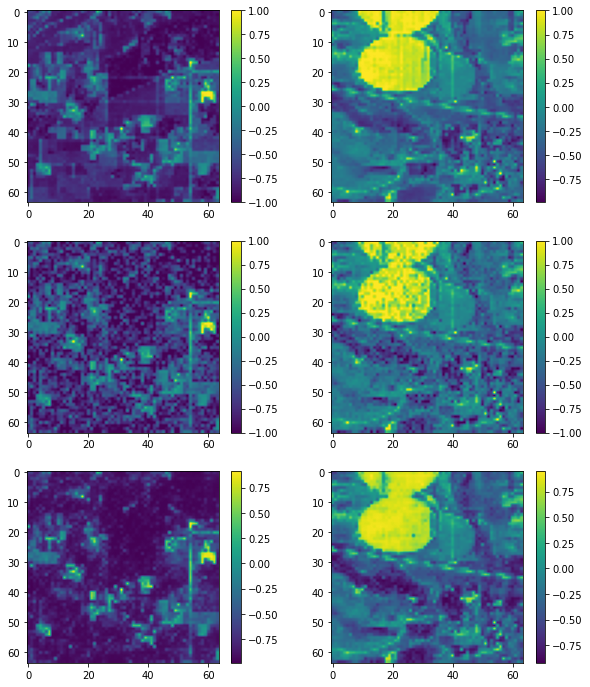

took 0.3173 minutes
[INFO] starting epoch 22/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1024.25634765625 loss_euclidian:  1024.02734375 loss_tv:  1144.996337890625
took 0.3054 minutes
[INFO] starting epoch 23/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  960.1651611328125 loss_euclidian:  959.941162109375 loss_tv:  1119.939453125
took 0.2948 minutes
[INFO] starting epoch 24/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  943.7088012695312 loss_euclidian:  943.48681640625 loss_tv:  1110.4278564453125
took 0.3064 minutes
[INFO] starting epoch 25/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1640.766357421875 loss_euclidian:  1640.47314453125 loss_tv:  1465.4837646484375
took 0.3056 minutes
[INFO] starting epoch 26/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1516.5782470703125 loss_euclidian:  1516.2618408203125 loss_tv:  1583.973876953125


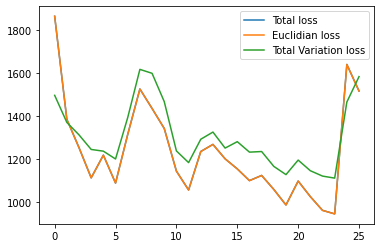

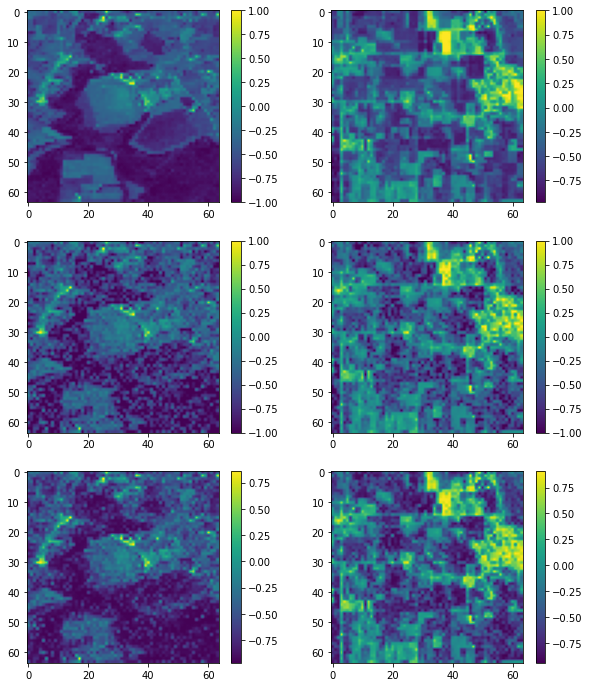

took 0.3171 minutes
[INFO] starting epoch 27/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1302.83544921875 loss_euclidian:  1302.5396728515625 loss_tv:  1481.55859375
took 0.302 minutes
[INFO] starting epoch 28/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1324.389892578125 loss_euclidian:  1324.12109375 loss_tv:  1345.3612060546875
took 0.298 minutes
[INFO] starting epoch 29/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1157.8896484375 loss_euclidian:  1157.6370849609375 loss_tv:  1261.6077880859375
took 0.3049 minutes
[INFO] starting epoch 30/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1073.480712890625 loss_euclidian:  1073.239013671875 loss_tv:  1209.461669921875
took 0.3005 minutes
[INFO] starting epoch 31/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1119.6243896484375 loss_euclidian:  1119.3865966796875 loss_tv:  1189.9752197265625


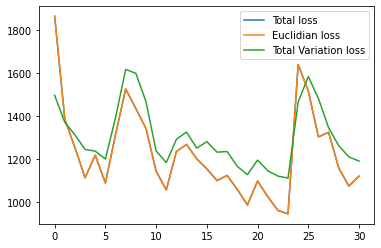

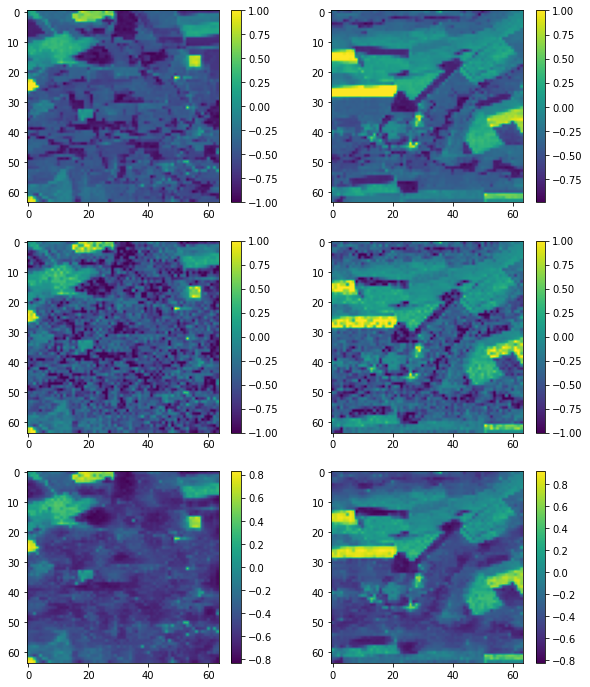

took 0.35 minutes
[INFO] starting epoch 32/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  982.5310668945312 loss_euclidian:  982.30126953125 loss_tv:  1148.9693603515625
took 0.3265 minutes
[INFO] starting epoch 33/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  988.6871948242188 loss_euclidian:  988.4579467773438 loss_tv:  1146.75537109375
took 0.3063 minutes
[INFO] starting epoch 34/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  974.644287109375 loss_euclidian:  974.4178466796875 loss_tv:  1134.109375
took 0.3117 minutes
[INFO] starting epoch 35/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1095.8570556640625 loss_euclidian:  1095.6239013671875 loss_tv:  1165.4952392578125
took 0.3002 minutes
[INFO] starting epoch 36/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1035.986572265625 loss_euclidian:  1035.75732421875 loss_tv:  1149.0643310546875


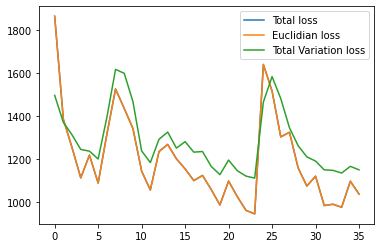

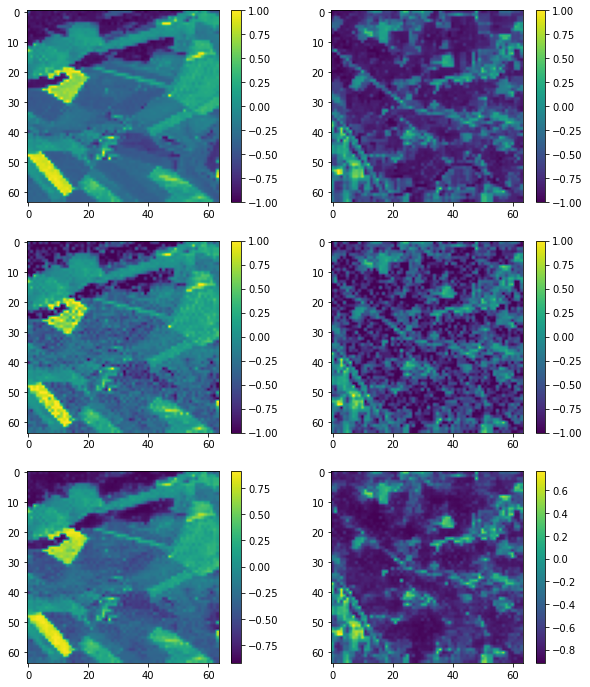

took 0.3249 minutes
[INFO] starting epoch 37/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1004.8070068359375 loss_euclidian:  1004.5806274414062 loss_tv:  1132.85107421875
took 0.3007 minutes
[INFO] starting epoch 38/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  900.0438842773438 loss_euclidian:  899.820556640625 loss_tv:  1116.146728515625
took 0.3083 minutes
[INFO] starting epoch 39/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  930.145751953125 loss_euclidian:  929.9202880859375 loss_tv:  1125.945556640625
took 0.3041 minutes
[INFO] starting epoch 40/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  906.5519409179688 loss_euclidian:  906.3300170898438 loss_tv:  1112.3912353515625
took 0.3002 minutes
[INFO] starting epoch 41/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  907.8533935546875 loss_euclidian:  907.6309204101562 loss_tv:  1113.096435546875


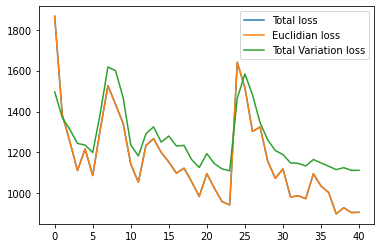

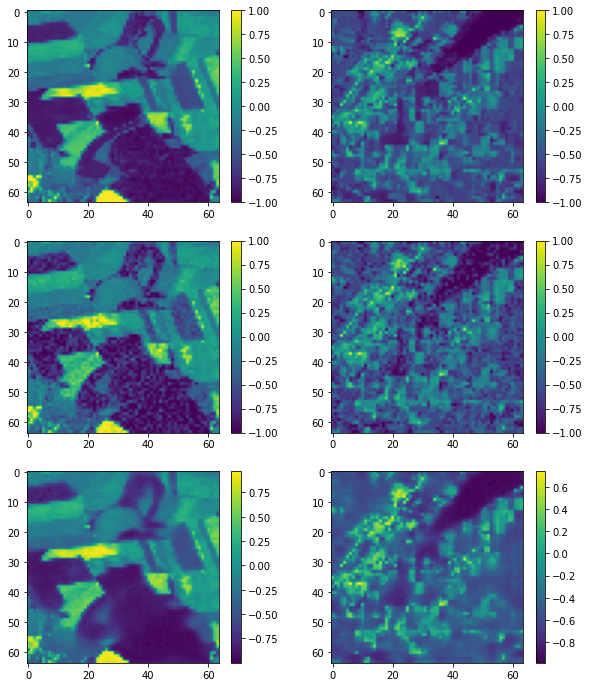

took 0.3327 minutes
[INFO] starting epoch 42/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  896.4874267578125 loss_euclidian:  896.2662353515625 loss_tv:  1103.9991455078125
took 0.2989 minutes
[INFO] starting epoch 43/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  899.017578125 loss_euclidian:  898.7968139648438 loss_tv:  1102.9150390625
took 0.3045 minutes
[INFO] starting epoch 44/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  983.5028686523438 loss_euclidian:  983.2759399414062 loss_tv:  1135.49462890625
took 0.3003 minutes
[INFO] starting epoch 45/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1252.96875 loss_euclidian:  1252.7001953125 loss_tv:  1344.3751220703125
took 0.3035 minutes
[INFO] starting epoch 46/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1139.8009033203125 loss_euclidian:  1139.5523681640625 loss_tv:  1242.323486328125


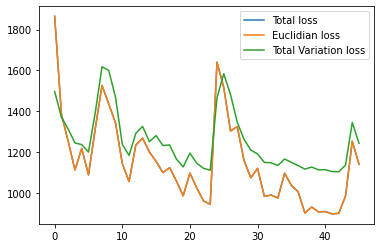

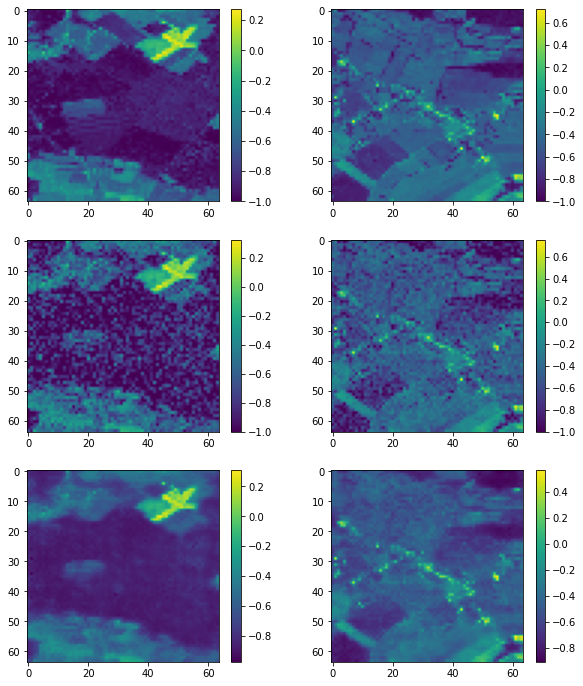

took 0.3364 minutes
[INFO] starting epoch 47/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  991.278564453125 loss_euclidian:  991.0524291992188 loss_tv:  1131.423095703125
took 0.3052 minutes
[INFO] starting epoch 48/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  893.571533203125 loss_euclidian:  893.3489379882812 loss_tv:  1114.032470703125
took 0.3064 minutes
[INFO] starting epoch 49/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1075.642822265625 loss_euclidian:  1075.3848876953125 loss_tv:  1291.9935302734375
took 0.2994 minutes
[INFO] starting epoch 50/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  954.8446655273438 loss_euclidian:  954.616455078125 loss_tv:  1140.791015625
took 0.3062 minutes
[INFO] starting epoch 51/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  951.014892578125 loss_euclidian:  950.7915649414062 loss_tv:  1116.102783203125


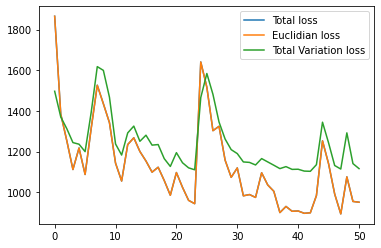

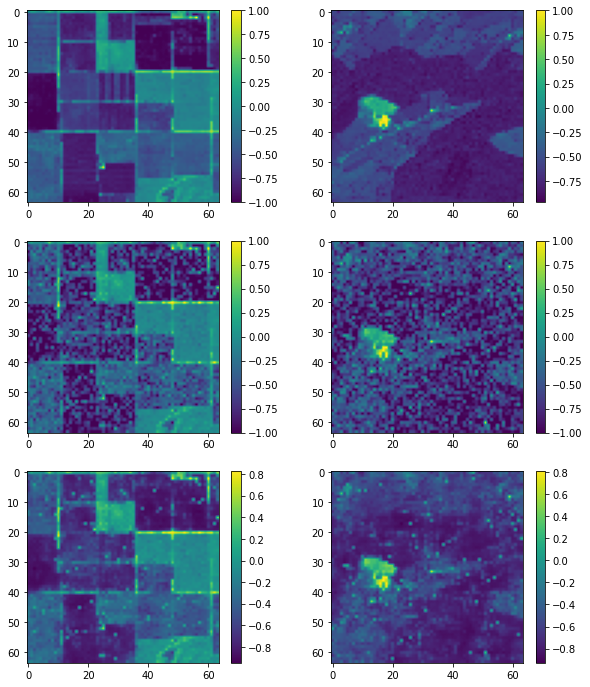

took 0.324 minutes
[INFO] starting epoch 52/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  924.1109008789062 loss_euclidian:  923.8905029296875 loss_tv:  1104.238525390625
took 0.3028 minutes
[INFO] starting epoch 53/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1070.489501953125 loss_euclidian:  1070.2589111328125 loss_tv:  1153.7901611328125
took 0.3037 minutes
[INFO] starting epoch 54/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  860.1045532226562 loss_euclidian:  859.8861694335938 loss_tv:  1092.4083251953125
took 0.3076 minutes
[INFO] starting epoch 55/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  881.7509155273438 loss_euclidian:  881.5332641601562 loss_tv:  1089.824951171875
took 0.304 minutes
[INFO] starting epoch 56/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  847.9811401367188 loss_euclidian:  847.765380859375 loss_tv:  1078.1778564453125


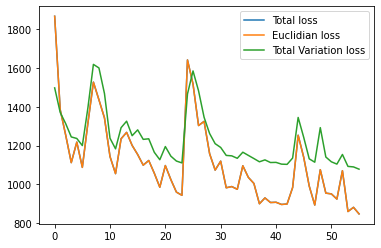

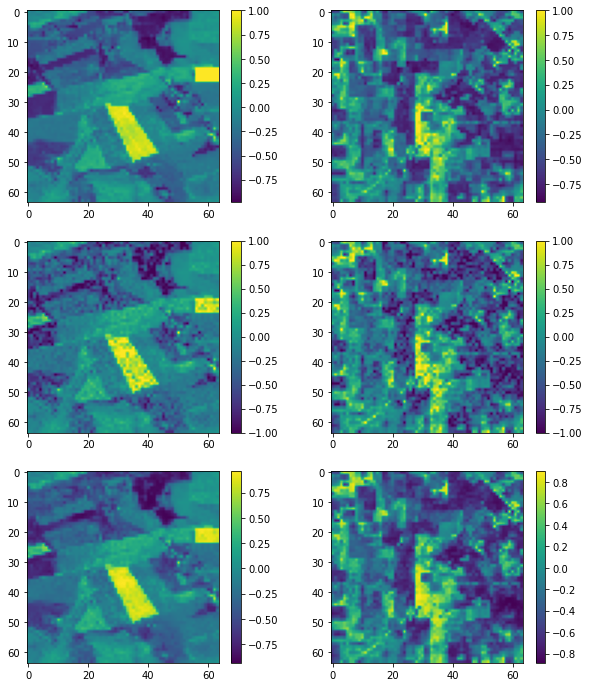

took 0.3266 minutes
[INFO] starting epoch 57/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  853.4235229492188 loss_euclidian:  853.206787109375 loss_tv:  1080.9256591796875
took 0.3069 minutes
[INFO] starting epoch 58/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  837.873779296875 loss_euclidian:  837.6578369140625 loss_tv:  1077.5775146484375
took 0.3 minutes
[INFO] starting epoch 59/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  875.7605590820312 loss_euclidian:  875.5440063476562 loss_tv:  1084.0115966796875
took 0.3072 minutes
[INFO] starting epoch 60/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  852.9368286132812 loss_euclidian:  852.721923828125 loss_tv:  1072.924560546875
took 0.303 minutes
[INFO] starting epoch 61/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  810.0162353515625 loss_euclidian:  809.8031005859375 loss_tv:  1067.2821044921875


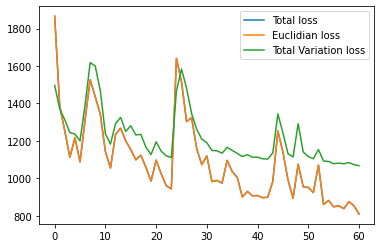

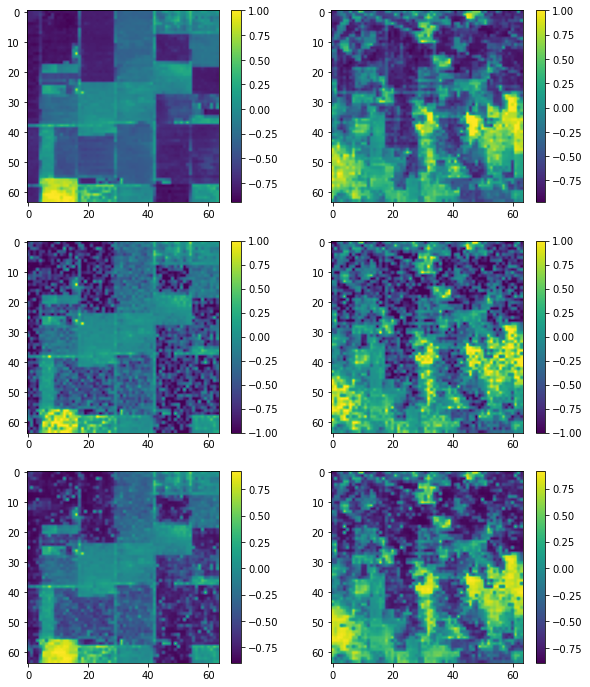

took 0.3272 minutes
[INFO] starting epoch 62/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  786.338623046875 loss_euclidian:  786.1234741210938 loss_tv:  1072.24951171875
took 0.3098 minutes
[INFO] starting epoch 63/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  820.6224975585938 loss_euclidian:  820.4081420898438 loss_tv:  1072.0487060546875
took 0.301 minutes
[INFO] starting epoch 64/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  813.8812866210938 loss_euclidian:  813.6659545898438 loss_tv:  1076.615234375
took 0.3051 minutes
[INFO] starting epoch 65/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  844.3410034179688 loss_euclidian:  844.1234130859375 loss_tv:  1086.4013671875
took 0.3052 minutes
[INFO] starting epoch 66/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  823.8992919921875 loss_euclidian:  823.6857299804688 loss_tv:  1065.6009521484375


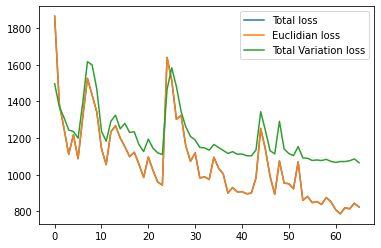

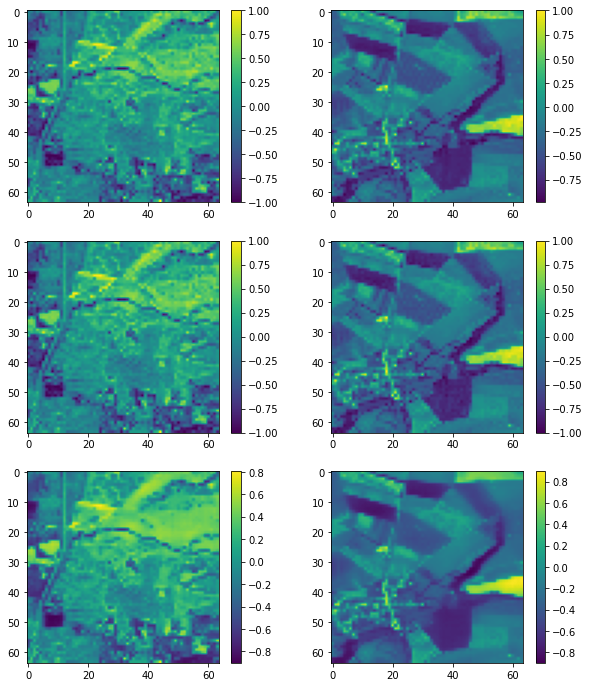

took 0.3283 minutes
[INFO] starting epoch 67/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  819.5701293945312 loss_euclidian:  819.3535766601562 loss_tv:  1080.2083740234375
took 0.3016 minutes
[INFO] starting epoch 68/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  802.4817504882812 loss_euclidian:  802.2689208984375 loss_tv:  1065.8045654296875
took 0.3005 minutes
[INFO] starting epoch 69/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  799.393310546875 loss_euclidian:  799.1806030273438 loss_tv:  1064.5272216796875
took 0.3003 minutes
[INFO] starting epoch 70/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  875.7522583007812 loss_euclidian:  875.5309448242188 loss_tv:  1104.796630859375
took 0.3035 minutes
[INFO] starting epoch 71/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1105.729736328125 loss_euclidian:  1105.481689453125 loss_tv:  1235.781494140625


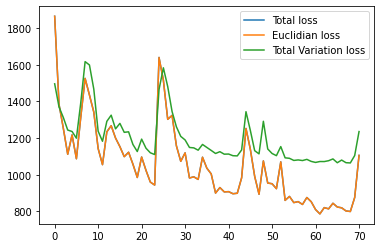

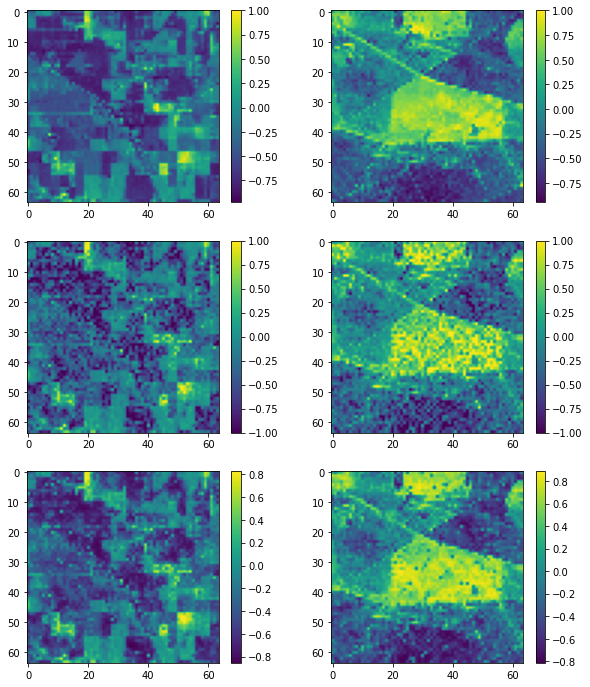

took 0.3269 minutes
[INFO] starting epoch 72/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  843.724365234375 loss_euclidian:  843.5057983398438 loss_tv:  1091.375244140625
took 0.3038 minutes
[INFO] starting epoch 73/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  792.1866455078125 loss_euclidian:  791.9723510742188 loss_tv:  1070.9605712890625
took 0.3049 minutes
[INFO] starting epoch 74/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  902.960205078125 loss_euclidian:  902.7283935546875 loss_tv:  1159.002685546875
took 0.296 minutes
[INFO] starting epoch 75/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  817.5833129882812 loss_euclidian:  817.3638305664062 loss_tv:  1096.2471923828125
took 0.3145 minutes
[INFO] starting epoch 76/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  811.7899169921875 loss_euclidian:  811.5718383789062 loss_tv:  1091.3902587890625


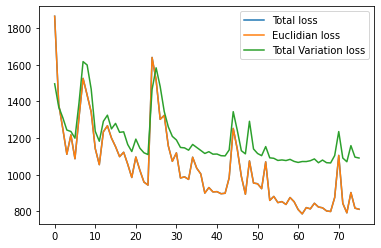

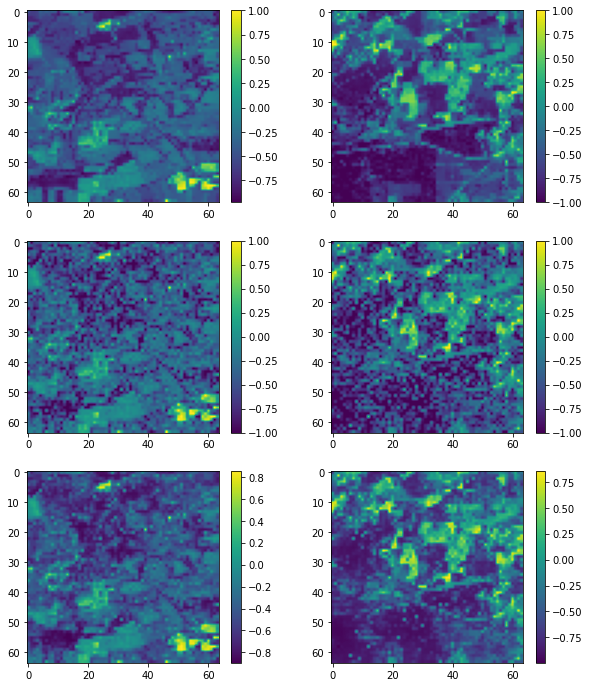

took 0.3268 minutes
[INFO] starting epoch 77/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  811.1320190429688 loss_euclidian:  810.9179077148438 loss_tv:  1069.33154296875
took 0.3025 minutes
[INFO] starting epoch 78/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  827.2998657226562 loss_euclidian:  827.0862426757812 loss_tv:  1068.276123046875
took 0.307 minutes
[INFO] starting epoch 79/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  835.6577758789062 loss_euclidian:  835.4415893554688 loss_tv:  1079.126953125
took 0.303 minutes
[INFO] starting epoch 80/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  828.7560424804688 loss_euclidian:  828.5414428710938 loss_tv:  1074.0814208984375
took 0.3058 minutes
[INFO] starting epoch 81/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  781.560546875 loss_euclidian:  781.345947265625 loss_tv:  1071.646484375


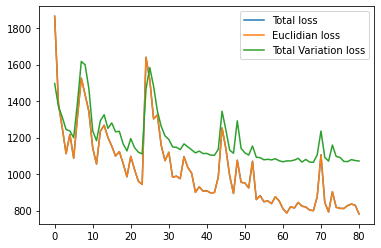

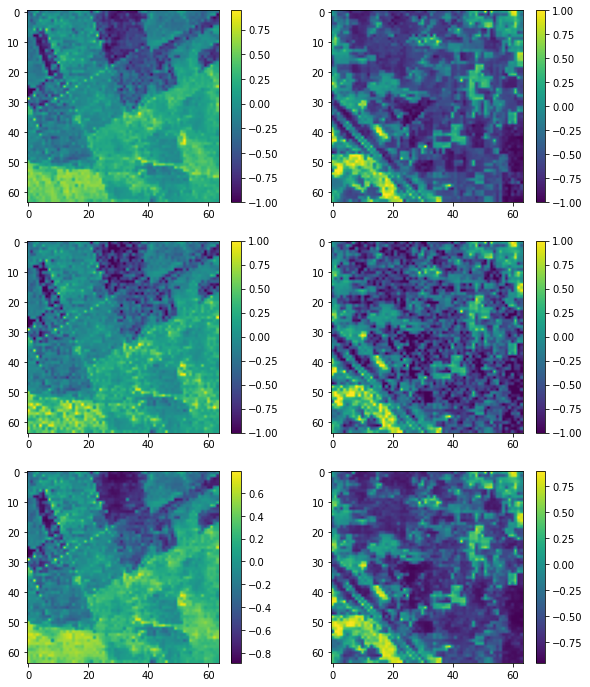

took 0.3223 minutes
[INFO] starting epoch 82/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  738.3854370117188 loss_euclidian:  738.1747436523438 loss_tv:  1051.50634765625
took 0.3075 minutes
[INFO] starting epoch 83/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  763.5490112304688 loss_euclidian:  763.338623046875 loss_tv:  1053.7652587890625
took 0.3022 minutes
[INFO] starting epoch 84/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  1018.9601440429688 loss_euclidian:  1018.7271728515625 loss_tv:  1164.4759521484375
took 0.3062 minutes
[INFO] starting epoch 85/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  885.2777709960938 loss_euclidian:  885.0550537109375 loss_tv:  1111.855712890625
took 0.3091 minutes
[INFO] starting epoch 86/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  839.69091796875 loss_euclidian:  839.4765625 loss_tv:  1072.13232421875


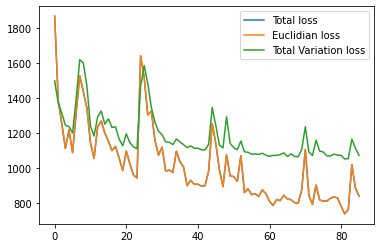

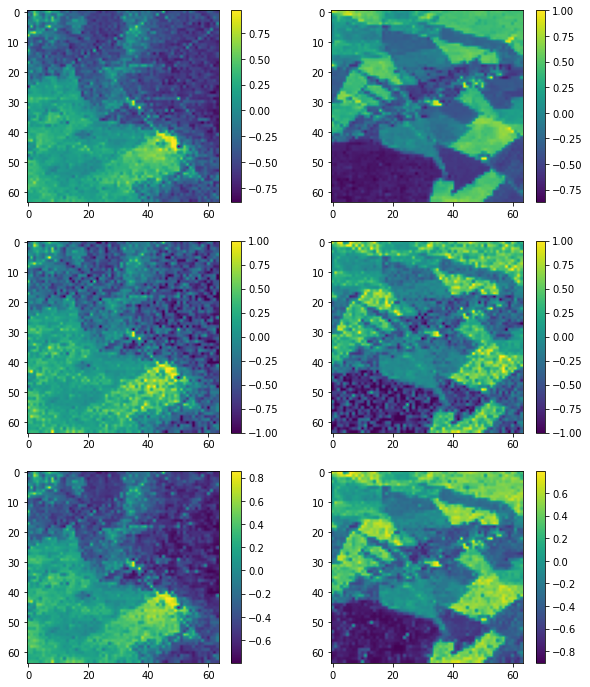

took 0.3209 minutes
[INFO] starting epoch 87/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  782.2570190429688 loss_euclidian:  782.0446166992188 loss_tv:  1061.9656982421875
took 0.3071 minutes
[INFO] starting epoch 88/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  767.4122924804688 loss_euclidian:  767.1986083984375 loss_tv:  1067.7012939453125
took 0.3047 minutes
[INFO] starting epoch 89/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  780.9375 loss_euclidian:  780.7274169921875 loss_tv:  1050.7845458984375
took 0.3065 minutes
[INFO] starting epoch 90/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  842.5911865234375 loss_euclidian:  842.3729248046875 loss_tv:  1090.5159912109375
took 0.2975 minutes
[INFO] starting epoch 91/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  860.8672485351562 loss_euclidian:  860.6533813476562 loss_tv:  1066.82958984375


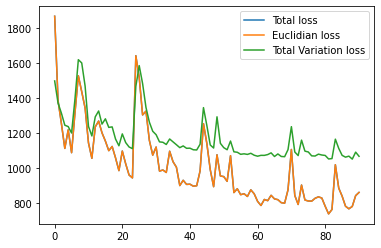

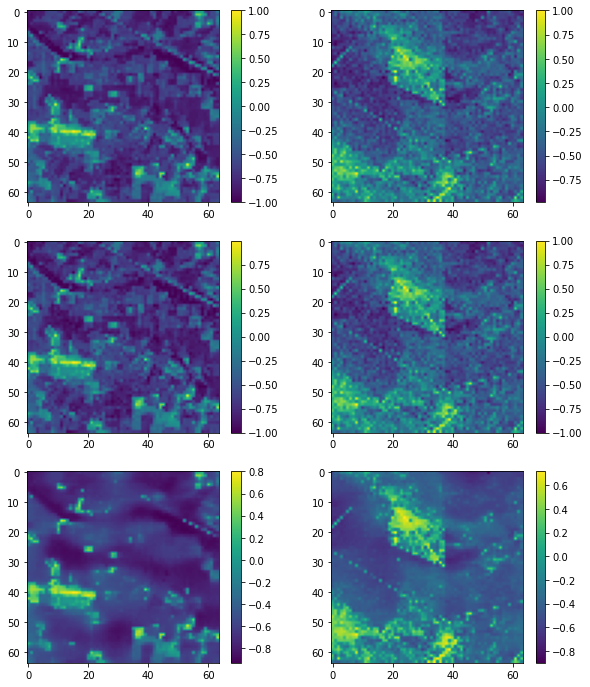

took 0.3308 minutes
[INFO] starting epoch 92/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  753.7503662109375 loss_euclidian:  753.5369873046875 loss_tv:  1067.9156494140625
took 0.3182 minutes
[INFO] starting epoch 93/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  794.4493408203125 loss_euclidian:  794.2381591796875 loss_tv:  1056.393798828125
took 0.2992 minutes
[INFO] starting epoch 94/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  766.9889526367188 loss_euclidian:  766.7771606445312 loss_tv:  1059.72119140625
took 0.306 minutes
[INFO] starting epoch 95/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  807.9364013671875 loss_euclidian:  807.7252197265625 loss_tv:  1055.742919921875
took 0.2977 minutes
[INFO] starting epoch 96/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  835.7614135742188 loss_euclidian:  835.550537109375 loss_tv:  1056.955322265625


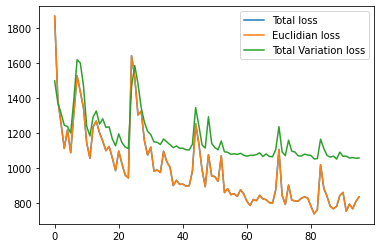

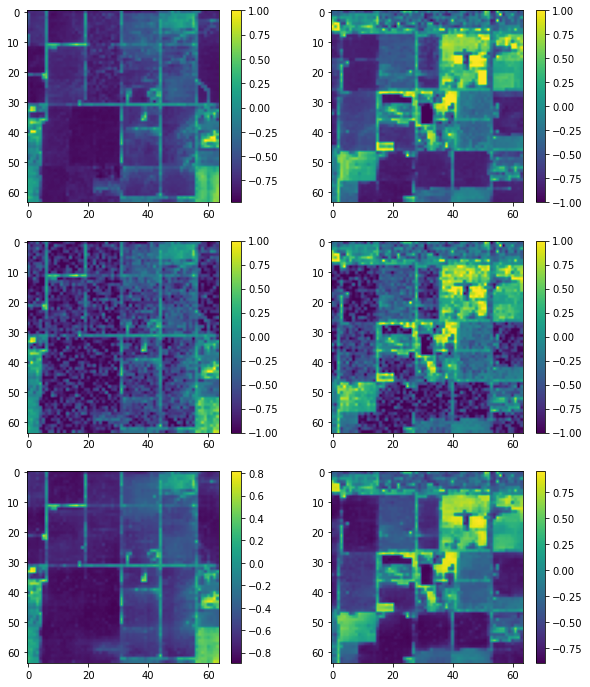

took 0.3224 minutes
[INFO] starting epoch 97/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  812.657958984375 loss_euclidian:  812.4464111328125 loss_tv:  1058.5457763671875
took 0.3019 minutes
[INFO] starting epoch 98/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  750.9691162109375 loss_euclidian:  750.7586669921875 loss_tv:  1052.8681640625
took 0.3087 minutes
[INFO] starting epoch 99/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  847.2155151367188 loss_euclidian:  847.0009155273438 loss_tv:  1072.3314208984375
took 0.3014 minutes
[INFO] starting epoch 100/100 , learning_rate 0.002

  0%|          | 0/250 [00:00<?, ?it/s]


Training_loss #  total loss:  933.2549438476562 loss_euclidian:  933.0271606445312 loss_tv:  1137.8212890625
took 0.2982 minutes


In [13]:
EPOCHS = 100
lr=2e-3

max_var=.3

opt = tf.keras.optimizers.Nadam(learning_rate=lr)
train_loss=[]
n_instances=train_generator.n
numUpdates = int(n_instances / BS)

for epoch in range(0, EPOCHS): 
    print("[INFO] starting epoch {}/{} , learning_rate {}".format(
        epoch + 1, EPOCHS,lr), end="")
    sys.stdout.flush()
    epochStart = time.time()
    loss = 0
    loss_batch = []
    for i in tqdm(range(0, numUpdates)):
        clean_data = next(train_generator)
        noisy_data=random_noise(clean_data,mode='speckle',var=np.random.uniform(high=max_var))
        loss = step(noisy_data,clean_data)
        loss_batch.append((loss))
    loss_batch = np.array(loss_batch)
    loss_batch = np.sum(loss_batch, axis=0) / len(loss_batch)
    total_loss,loss_euclidian,loss_tv=loss_batch
    train_loss.append(loss_batch)
    print('\nTraining_loss # ', 'total loss: ', float(total_loss),
          'loss_euclidian: ', float(loss_euclidian),
          'loss_tv: ', float(loss_tv),)
    if epoch % 5==0:
        plt.plot(train_loss)
        plt.legend(['Total loss','Euclidian loss','Total Variation loss'])
        plt.show()
        test_model(train_generator)
    sys.stdout.flush()

    epochEnd = time.time()
    elapsed = (epochEnd - epochStart) / 60.0
    print("took {:.4} minutes".format(elapsed))

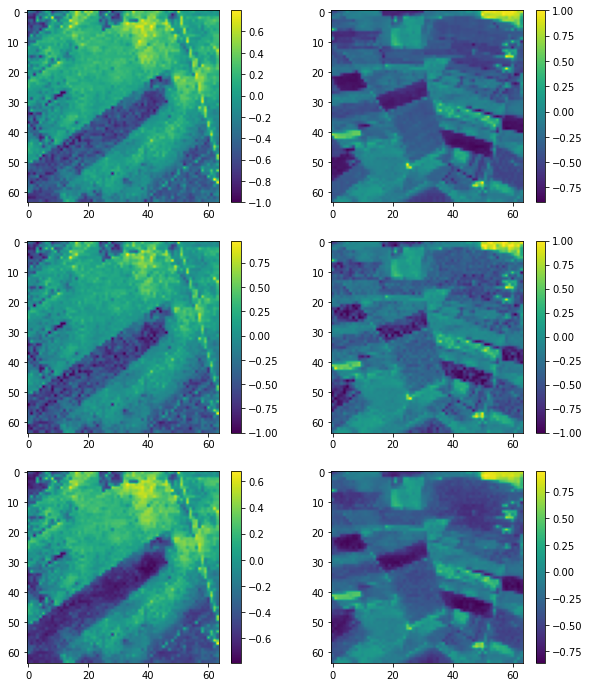

In [14]:
test_model(train_generator)